In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import csv
import random
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [2]:
# Открываем тренировочные данные
data_train = pd.read_csv('application_train.csv')
print('Size data_train: ', data_train.shape)
data_train.head()

Size data_train:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
# Открываем тестовые данные (для изменения для послудующей проверки)
data_test = pd.read_csv('application_test.csv')
print('Size data_train: ', data_test.shape)
data_test.head()

Size data_train:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


0    282686
1     24825
Name: TARGET, dtype: int64
AxesSubplot(0.125,0.125;0.775x0.755)


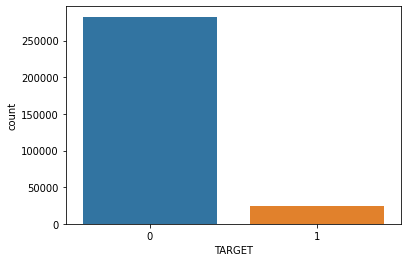

In [4]:
# Проводим разведку данных

# Узнаем сколько кредитов было выплачено вовремя и нет
print(data_train['TARGET'].value_counts())
print(sns.countplot(data_train['TARGET']))

# Как видим из рисунка данные несбалансированы, преобладают те люди которые уплатили вовремя


In [5]:
# Количество столбцов каждого типа
data_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

In [6]:
# Функция которая вычисляет количество пропущенных значений в столбце (а так же процент)
def missing_values_table(df):
        # Всего прощенных значений
        mis_val = df.isnull().sum()
        
        # Процент пропущенных значений
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Составление таблицы результатов
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        
        # Создание шапки таблицы (наименование столбцов)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Сортировать таблицу по проценту отсутствующих по убыванию
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        
        # Распечатать информацию
        print ("Выбранные вами данные имеют " + str(df.shape[1]) + " столбца.\n"      
            "Из них " + str(mis_val_table_ren_columns.shape[0]) +
              " столбцы с пропущенными значениями.")
        
        return mis_val_table_ren_columns
    
    
# Статистика по отсутствующим значениям
missing_values = missing_values_table(data_train)
missing_values.tail(60)

Выбранные вами данные имеют 122 столбца.
Из них 67 столбцы с пропущенными значениями.


,Missing Values,% of Total Values
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4
FLOORSMIN_MODE,208642,67.8
FLOORSMIN_MEDI,208642,67.8
FLOORSMIN_AVG,208642,67.8
YEARS_BUILD_MODE,204488,66.5
YEARS_BUILD_MEDI,204488,66.5
YEARS_BUILD_AVG,204488,66.5
OWN_CAR_AGE,202929,66.0


In [7]:
# Проведем разведку данных по числовым значениям

numerical_features = data_train.select_dtypes(include = ['float64', 'int64']).columns
abs(data_train[numerical_features]).hist(figsize=(150, 150), bins=30, xlabelsize=8, ylabelsize=8)

array([[<AxesSubplot:title={'center':'SK_ID_CURR'}>,
        <AxesSubplot:title={'center':'TARGET'}>,
        <AxesSubplot:title={'center':'CNT_CHILDREN'}>,
        <AxesSubplot:title={'center':'AMT_INCOME_TOTAL'}>,
        <AxesSubplot:title={'center':'AMT_CREDIT'}>,
        <AxesSubplot:title={'center':'AMT_ANNUITY'}>,
        <AxesSubplot:title={'center':'AMT_GOODS_PRICE'}>,
        <AxesSubplot:title={'center':'REGION_POPULATION_RELATIVE'}>,
        <AxesSubplot:title={'center':'DAYS_BIRTH'}>,
        <AxesSubplot:title={'center':'DAYS_EMPLOYED'}>],
       [<AxesSubplot:title={'center':'DAYS_REGISTRATION'}>,
        <AxesSubplot:title={'center':'DAYS_ID_PUBLISH'}>,
        <AxesSubplot:title={'center':'OWN_CAR_AGE'}>,
        <AxesSubplot:title={'center':'FLAG_MOBIL'}>,
        <AxesSubplot:title={'center':'FLAG_EMP_PHONE'}>,
        <AxesSubplot:title={'center':'FLAG_WORK_PHONE'}>,
        <AxesSubplot:title={'center':'FLAG_CONT_MOBILE'}>,
        <AxesSubplot:title={'center':'FLA

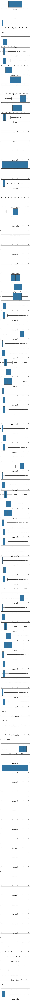

In [8]:

fig, axes = plt.subplots(nrows=len(numerical_features), ncols=1)
fig.set_size_inches(10, 350)
for i, col in enumerate(numerical_features):
    sns.boxplot(data_train[col], ax=axes[i])
plt.show()

In [9]:
# Найдем корреляцию с 'TARGET'
correlations = abs(data_train.corr()['TARGET']).sort_values()

print('\nНаибольшая корреляция:\n', correlations.tail(20))


Наибольшая корреляция:
 OWN_CAR_AGE                    0.037612
AMT_GOODS_PRICE                0.039645
DAYS_REGISTRATION              0.041975
FLOORSMAX_MODE                 0.043226
FLOORSMAX_MEDI                 0.043768
FLOORSMAX_AVG                  0.044003
FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
DAYS_EMPLOYED                  0.044932
FLAG_EMP_PHONE                 0.045982
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
EXT_SOURCE_1                   0.155317
EXT_SOURCE_2                   0.160472
EXT_SOURCE_3                   0.178919
TARGET                         1.000000
Name: TARGET, dtype: float64


In [10]:
correlation_matrix = data_train.corr()
mask = np.triu(correlation_matrix)
fig, ax = plt.subplots(figsize=(150, 150))
ax = sns.heatmap(correlation_matrix, mask=mask, vmax=0.6, square=True, annot=True)
print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 122)
Размер тестовых данных:  (48744, 121)


In [11]:
# Из этих данных (пропущенных значений, гистограм и boxblot)
# Можно сделать пару выводов, нам нужно убрать данные где количество пропущенных значений больше 30%
# Так же, есть отдельная фича которую надо обработать самостоятельно:
# DAYS_EMLOYED - проблема заключается в неточности данных (больше 1000 лет) (просто убираем данную информацию и заполняем модой)
data_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

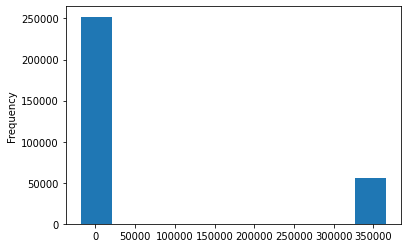

In [12]:
data_train['DAYS_EMPLOYED'].plot.hist();

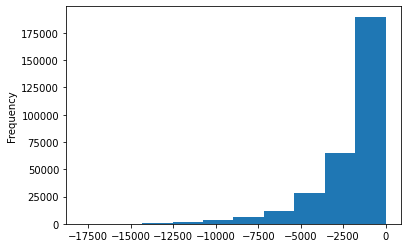

In [13]:
# Обработаем 'DAYS_EMPLOYED'

data_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
data_test['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

data_train['DAYS_EMPLOYED'] = data_train['DAYS_EMPLOYED'].fillna(data_train['DAYS_EMPLOYED'].value_counts().index[0])
data_test['DAYS_EMPLOYED'] = data_test['DAYS_EMPLOYED'].fillna(data_test['DAYS_EMPLOYED'].value_counts().index[0])

data_train['DAYS_EMPLOYED'].plot.hist();

In [14]:
# Удалим фичи с высоким пронцентом потерь 
def delete_high_missing_values(data_train, missing_values):
    for i in range(len(missing_values)):
        if (missing_values.iloc[i,1] > 20):
            data_train.drop(missing_values.index[i], axis='columns', inplace=True)
            data_test.drop(missing_values.index[i], axis='columns', inplace=True)

missing_values = missing_values_table(data_train)
delete_high_missing_values(data_train, missing_values)
print('Size data_train: ', data_train.shape)

Выбранные вами данные имеют 122 столбца.
Из них 67 столбцы с пропущенными значениями.
Size data_train:  (307511, 72)


In [15]:
# Заполним допустимое количество значений модой и найдем теперь кореляцию по 'TARGET'

# moda

def data_mode(data):
    i = 0
    features_list = list(data)
    for number in data.isnull().sum():
        if number > 0:
            data[features_list[i]] = data[features_list[i]].fillna(data[features_list[i]].value_counts().index[0])
        i = i + 1
        
data_mode(data_train)
data_mode(data_test)

# Найдем корреляцию с 'TARGET'
correlations = abs(data_train.corr()['TARGET']).sort_values()

print('\nНаибольшая корреляция:\n', correlations.tail(20))



Наибольшая корреляция:
 AMT_CREDIT                     0.030369
DEF_60_CNT_SOCIAL_CIRCLE       0.031401
DEF_30_CNT_SOCIAL_CIRCLE       0.032394
LIVE_CITY_NOT_WORK_CITY        0.032518
REGION_POPULATION_RELATIVE     0.037227
AMT_GOODS_PRICE                0.039623
DAYS_REGISTRATION              0.041975
FLAG_DOCUMENT_3                0.044346
REG_CITY_NOT_LIVE_CITY         0.044395
FLAG_EMP_PHONE                 0.045982
DAYS_EMPLOYED                  0.048199
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.055217
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
DAYS_BIRTH                     0.078239
EXT_SOURCE_3                   0.127891
EXT_SOURCE_2                   0.160039
TARGET                         1.000000
Name: TARGET, dtype: float64


In [16]:
# Обработка категориальных значений
# Количество уникальных категориальных значений в каждом столбце
data_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
dtype: int64

In [17]:
# Замена катеригориальных значений на дискретные в отдельные колонки

# Если количество уникальных категориальных значений в столбце 2 то импользуем LabelEncoder
le = LabelEncoder()
for col in data_train:
    if data_train[col].dtype == 'object':
        # Если 2 или меньше уникальных категорий
        if len(list(data_train[col].unique())) <= 2:
            # Тренируемся на обучающих данных
            le.fit(data_train[col])
            # Преобразование данных
            data_train[col] = le.transform(data_train[col])
            data_test[col] = le.transform(data_test[col])

# Если больше то one-hot encoding
data_train = pd.get_dummies(data_train)
data_test = pd.get_dummies(data_test)

print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 164)
Размер тестовых данных:  (48744, 160)


In [18]:
# Выровняем таблицы по размеру обучающих и тренировачных данных.
# Для этого сохраним значения столбца 'TARGET'
train_labels = data_train['TARGET']

# Проверим на одинаковые столбцы две таблицы и удалим которые не совпадают
data_train, data_test = data_train.align(data_test, join = 'inner', axis = 1)

# Обратно вернем в обучающие данные значение 'TARGET'
data_train['TARGET'] = train_labels

print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 161)
Размер тестовых данных:  (48744, 160)


In [19]:
# Построим матрицу корреляции
correlation_matrix = data_train.corr()
mask = np.triu(correlation_matrix)
fig, ax = plt.subplots(figsize=(150, 150))
ax = sns.heatmap(correlation_matrix, mask=mask, vmax=0.6, square=True, annot=True)
print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 161)
Размер тестовых данных:  (48744, 160)


In [20]:
# Почистим нашу матрицу от высоких значений корреляции

def delete_high_corr(df, correlation_matrix):
    high_correlation_set = set()
    counter = 0
    df_columns = list(df)
    for i in range(len(correlation_matrix)):
        for j in range(i + 1, len(correlation_matrix)):
            if abs(correlation_matrix[df_columns[i]][df_columns[j]]) > 0.9:
                high_correlation_set.add(df_columns[j])
                counter = counter + 1
    for feature in high_correlation_set:
        data_train.drop(feature, axis='columns', inplace=True)
        data_test.drop(feature, axis='columns', inplace=True)
        
delete_high_corr(data_train, correlation_matrix)

In [21]:
correlation_matrix = data_train.corr()
mask = np.triu(correlation_matrix)
fig, ax = plt.subplots(figsize=(150, 150))
ax = sns.heatmap(correlation_matrix, mask=mask, vmax=0.6, square=True, annot=True)
print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 155)
Размер тестовых данных:  (48744, 154)


In [22]:
# Выровняем таблицы по размеру обучающих и тренировачных данных.
# Для этого сохраним значения столбца 'TARGET'
train_labels = data_train['TARGET']

# Проверим на одинаковые столбцы две таблицы и удалим которые не совпадают
data_train, data_test = data_train.align(data_test, join = 'inner', axis = 1)

# Обратно вернем в обучающие данные значение 'TARGET'
data_train['TARGET'] = train_labels

print('Размер обучающих данных: ', data_train.shape)
print('Размер тестовых данных: ', data_test.shape)

Размер обучающих данных:  (307511, 155)
Размер тестовых данных:  (48744, 154)


In [23]:
  
data_train_x = data_train.copy()
data_train_y = data_train['TARGET'].copy()
data_train_x.drop(['TARGET','SK_ID_CURR'], axis='columns', inplace=True)


data_test_x = data_test.copy()
data_test_x.drop('SK_ID_CURR', axis='columns', inplace=True)


In [24]:
# DecisionTreeClassifier

x_train, x_test, y_train, y_test = train_test_split(data_train_x, data_train_y, test_size=0.15)


clf = DecisionTreeClassifier(max_depth=6)
clf.fit(x_train, y_train)


test_preds = clf.predict_proba(x_test)
test_preds = test_preds[:, 1]
train_preds = clf.predict_proba(x_train)
train_preds = train_preds[:, 1]

lr_auc = roc_auc_score(y_test, test_preds)
tr_auc = roc_auc_score(y_train, train_preds)

print('train:ROC AUC=%f' % (tr_auc))
print('test: ROC AUC=%f' % (lr_auc))

end_test_preds = clf.predict_proba(data_test_x)
end_test_preds = end_test_preds[:, 1]
print(end_test_preds)

 # Make the submission dataframe
submission = pd.DataFrame({'SK_ID_CURR': data_test['SK_ID_CURR'], 'TARGET': end_test_preds})
submission.to_csv('submissionTree.csv', index = False)



train:ROC AUC=0.711852
test: ROC AUC=0.711863
[0.06142241 0.17154124 0.04829042 ... 0.12986811 0.04227884 0.12986811]
